# HybridNetv6

**Version**: 6.0.0<br>
**Date**: Mon Aug 18th, 2025<br>
**Author**: Jakob Balkovec<br>

**Model Description**: `TODO`

---
## Imports

In [1]:
!pip install scikit-multilearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.4/89.4 kB 4.0 MB/s eta 0:00:00


In [2]:
# standard library
import os
import random
import importlib
import math
import time
import csv
import gc

# TP
import numpy as np
import pandas as pd
from PIL import Image
from google.colab import drive
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import albumentations as A
from albumentations.core.transforms_interface import ImageOnlyTransform
from albumentations.pytorch import ToTensorV2

# PyT
import torch
from torch import amp
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.multiprocessing as mp
from torch.utils.data import WeightedRandomSampler

# TV
from torchvision import transforms, models
from torchvision.transforms import InterpolationMode

# SKL
from skmultilearn.model_selection import iterative_train_test_split

gc.collect()
torch.cuda.empty_cache()

config = {
    "MASTER_DF_PATH": "/content/patches/patches/master_df.pkl",
    "IMAGE_ROOT": "/content/images/Original_Images",
    "PATCHES_ROOT": "/content/patches/",
    "MASK_DIR": "/content/masks",
    "OUTPUT_DIR": "/content/output",
    "DRIVE_MODEL_DIR": "/content/drive/MyDrive/models",
    "DRIVE_MODEL_PATH": "/content/drive/MyDrive/models/hybridnet_v6.pth",
    "SEED": 42,
    "IMG_SIZE": 512,
    "PATCH_SIZE": 128,
    "BATCH_SIZE": 1,
    "EPOCHS": 25,
    "LR": 2.5e-5,
    "WEIGHT_DECAY": 1e-4,
    "VAL_INTERVAL": 1,
    "FIXED_PATCHES": None,
    "ACCUM_STEPS": 4,
    "NUM_WORKERS": max(0, min(4, (os.cpu_count() or 2)//2)),

    "LOSS_TYPE": "focal_tversky",  # "dice" | "dice_bce" | "tversky" | "dice_bce_w"
    "BCE_WEIGHT": 0.7,

    # ===== FINE TUNE =======
    "TV_ALPHA": 0.3,
    "TV_BETA": 0.7,
    "FT_GAMMA": 1.0,
    "FT_LAMBDA": 0.7,

    "PATCH_POS_RATIO": 0.5, # 0.6? tune!
    # ===== FINE TUNE =======

    "LR_MIN": 1e-6,
    "LR_FACTOR": 0.5,
    "LR_PATIENCE": 2,

    "PATCH_CHUNK": 25,

    "MAX_NORM": 1.0,

    "MODE": "blend", # replace (moderate emph) | replicate (strong emph) | blend (default)
    "POST_MIN_AREA": 25,

    "EARLY_STOP_MONITOR": "val_dice_mean",
    "EARLY_STOP_MODE": "max",
    "EARLY_STOP_PATIENCE": 6,
    "EARLY_STOP_MIN_DELTA": 0.001,
    "MAX_TIME_MIN": 120,
    "LOSS_SPIKE_FACTOR": 3.0,

    "TRAIN_FRAC": 0.70,
    "VAL_FRAC": 0.15,
    "TEST_FRAC": 0.15,
    "FORCE_RESPLIT": False,

    "THRESH_PER_CLASS": [0.90, 0.90, 0.80, 0.90],  # [MA, HE, EX, SE]
}

HISTORY = {
    "train_loss": [],
    "train_dice_mean": [],
    "train_dice_per_class": [],
    "train_iou_mean": [],
    "train_iou_per_class": [],
    "val_loss": [],
    "val_dice_mean": [],
    "val_dice_per_class": [],
    "val_iou_mean": [],
    "val_iou_per_class": [],
}

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

torch.manual_seed(config["SEED"])
np.random.seed(config["SEED"])
random.seed(config["SEED"])
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

os.makedirs(config["OUTPUT_DIR"], exist_ok=True)
os.makedirs(config["DRIVE_MODEL_DIR"], exist_ok=True)

METRICS_DIR = os.path.join(config["OUTPUT_DIR"], "metrics_logs")
VISUALS_DIR = os.path.join(config["OUTPUT_DIR"], "visuals")
PREDICTIONS_DIR = os.path.join(config["OUTPUT_DIR"], "predictions")

for d in [METRICS_DIR, VISUALS_DIR, PREDICTIONS_DIR]:
    os.makedirs(d, exist_ok=True)

SPLIT_CSV = os.path.join(METRICS_DIR, "image_split.csv")
SPLIT_SUMMARY_CSV = os.path.join(METRICS_DIR, "split_summary.csv")
os.makedirs(os.path.dirname(SPLIT_CSV), exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"\nusing: {device}")
assert device.type == "cuda", "CUDA device not available || still in CPU mode"


using: cuda


---
## Environment

#### Multiprocessing Context

In [3]:
class NopDS(Dataset):
    def __len__(self): return 64
    def __getitem__(self, i): return torch.zeros(3,16,16), i

def try_ctx(ctx_name):
    print(f"\n=== testing multiprocessing_context='{ctx_name}' ===")
    ctx = mp.get_context(ctx_name)
    loader = DataLoader(
        NopDS(), batch_size=8, shuffle=False,
        num_workers=2,
        multiprocessing_context=ctx,
        persistent_workers=False,
        pin_memory=False,
        prefetch_factor=2,
        timeout=0,
    )
    b = next(iter(loader))
    print("OK:", b[0].shape, b[1][:4])

for name in ["forkserver", "spawn", "fork"]:
    try:
        try_ctx(name)
    except Exception as e:
        print(f"FAILED ({name}): {type(e).__name__}: {e}")



=== testing multiprocessing_context='forkserver' ===
FAILED (forkserver): RuntimeError: DataLoader worker (pid(s) 1356, 1357) exited unexpectedly

=== testing multiprocessing_context='spawn' ===
FAILED (spawn): RuntimeError: DataLoader worker (pid(s) 1433, 1434) exited unexpectedly

=== testing multiprocessing_context='fork' ===
OK: torch.Size([8, 3, 16, 16]) tensor([0, 1, 2, 3])


In [4]:
# fast flags
torch.backends.cudnn.benchmark = True
torch.set_float32_matmul_precision("high")
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"

try:
    mp.set_sharing_strategy("file_system")
except Exception as e:
    print("set_sharing_strategy:", e)

try:
    mp.set_start_method("fork", force=True) # or forkserver
    importlib.reload(torch.utils.data)
except RuntimeError as e:
    print("set_start_method:", e)

print("start_method:    ", mp.get_start_method(allow_none=True))
print("sharing_strategy:", mp.get_sharing_strategy())

start_method:     fork
sharing_strategy: file_system


#### Drive

In [5]:
if os.path.isdir('/content/drive') and os.listdir('/content/drive'):
    print("non-empty mountpoint")

    # unmount
    if os.path.ismount('/content/drive'):
        drive.flush_and_unmount()
        print("drive unmounted.")

    !rm -rf /content/drive/*

# mount
drive.mount('/content/drive', force_remount=True)

non-empty mountpoint
Mounted at /content/drive


---
## Data

In [6]:
# extract "pathces.7z"
!7z x "/content/drive/MyDrive/patches.7z" -o"/content/patches" -y

# TB REMOVED
# passwd: DRpatchesWedJul9

# unzip "images.zip"
!unzip "/content/drive/MyDrive/images.zip" -d /content/images

# unzip "masks.zip"
!unzip "/content/drive/MyDrive/masks.zip" -d /content/masks

Izpis pretočnega predvajanja je skrajšan na toliko zadnjih vrstic: 5000.
  inflating: /content/masks/Hemorrhage_Masks/0921_1.png  
  inflating: /content/masks/Hemorrhage_Masks/1080_3.png  
  inflating: /content/masks/Hemorrhage_Masks/1226_1.png  
  inflating: /content/masks/Hemorrhage_Masks/0226_1.png  
  inflating: /content/masks/Hemorrhage_Masks/0263_1.png  
  inflating: /content/masks/Hemorrhage_Masks/0999_1.png  
  inflating: /content/masks/Hemorrhage_Masks/1750_3.png  
  inflating: /content/masks/Hemorrhage_Masks/0803_3.png  
  inflating: /content/masks/Hemorrhage_Masks/1278_2.png  
  inflating: /content/masks/Hemorrhage_Masks/1491_3.png  
  inflating: /content/masks/Hemorrhage_Masks/1573_1.png  
  inflating: /content/masks/Hemorrhage_Masks/0728_3.png  
  inflating: /content/masks/Hemorrhage_Masks/0304_3.png  
  inflating: /content/masks/Hemorrhage_Masks/0341_3.png  
  inflating: /content/masks/Hemorrhage_Masks/0959_1.png  
  inflating: /content/masks/Hemorrhage_Masks/1611_2.png  

#### Frame

In [7]:
patch_df = pd.read_pickle(config["MASTER_DF_PATH"])
patch_df.head(n=2)

,image_id,patch_id,file_path,filter_tag,coordinates,center,label_vector
0,0000_1,0000_1_1216_1216,patches/0000_1/all/0000_1_1216_1216.png,black,"{'top-left': (1152, 1152), 'top-right': (1279,...","{'x': 1216, 'y': 1216}","[0, 0, 0, 0]"
1,0000_1,0000_1_832_320,patches/0000_1/all/0000_1_832_320.png,healthy,"{'top-left': (768, 256), 'top-right': (895, 25...","{'x': 832, 'y': 320}","[0, 0, 0, 0]"


---
## Split

#### Helpers

In [8]:
def _merge_labels(label_list):
    arr = np.vstack(label_list).astype(int)
    return np.clip(arr.sum(axis=0), 0, 1).tolist()

def stratified_split(image_df, train_frac=0.7, val_frac=0.15, seed=42):
    rng = np.random.RandomState(seed)
    X = np.arange(len(image_df)).reshape(-1, 1)
    Y = np.array(image_df["image_label"].to_list())

    # first split: train vs (val+test)
    X_train, Y_train, X_tmp, Y_tmp = iterative_train_test_split(
        X, Y, test_size=(1 - train_frac)
    )

    # second split: val vs test from tmp
    val_frac_rel = val_frac / (1 - train_frac)
    X_val, Y_val, X_test, Y_test = iterative_train_test_split(
        X_tmp, Y_tmp, test_size=(1 - val_frac_rel)
    )

    idx_train = X_train.ravel()
    idx_val   = X_val.ravel()
    idx_test  = X_test.ravel()

    split = np.full(len(image_df), "train", dtype=object)
    split[idx_val]  = "val"
    split[idx_test] = "test"

    image_df = image_df.copy()
    image_df["split"] = split
    return image_df

def summarize_split(name, idx, Y):
    subset = Y[idx]
    counts = subset.sum(axis=0).tolist()        # number of positive images per class
    rates  = subset.mean(axis=0).round(4).tolist()
    return {"name": name, "n": int(len(idx)), "counts": counts, "rates": rates}

In [9]:
# sanity
assert abs(config["TRAIN_FRAC"] + config["VAL_FRAC"] + config["TEST_FRAC"] - 1.0) < 1e-9

need_cols = {"image_id", "label_vector", "file_path"}
missing = need_cols - set(patch_df.columns)
assert not missing, f"patch_df missing columns: {missing}"

image_df = (
    patch_df.groupby("image_id", as_index=False)["label_vector"]
            .apply(lambda s: _merge_labels(list(s)))
            .rename(columns={"label_vector": "image_label"})
)
image_df["image_path"] = image_df["image_id"].apply(
    lambda x: os.path.join(config["IMAGE_ROOT"], f"{x}.png")
)

K = len(image_df["image_label"].iloc[0])
Y = np.array(image_df["image_label"].to_list(), dtype=int)
N = len(image_df)

if config["FORCE_RESPLIT"] or not os.path.isfile(SPLIT_CSV):
    image_df = stratified_split(
        image_df,
        train_frac=config["TRAIN_FRAC"],
        val_frac=config["VAL_FRAC"],
        seed=config["SEED"],
    )
    image_df[["image_id", "split"]].to_csv(SPLIT_CSV, index=False)
else:
    prev = pd.read_csv(SPLIT_CSV)
    image_df = image_df.merge(prev, on="image_id", how="left")
    image_df["split"] = image_df["split"].fillna("train")

image_split_map = dict(zip(image_df["image_id"], image_df["split"]))
patch_df["split"] = patch_df["image_id"].map(image_split_map)
assert patch_df["split"].notna().all()

idx_train = image_df.index[image_df["split"] == "train"].to_numpy()
idx_val   = image_df.index[image_df["split"] == "val"].to_numpy()
idx_test  = image_df.index[image_df["split"] == "test"].to_numpy()

def _summarize(name, idx, Y):
    subset = Y[idx]
    counts = subset.sum(axis=0).astype(int).tolist()   # [+] image counts per class
    rates  = subset.mean(axis=0).round(4).tolist()     # [+] image rates per class
    return {"name": name, "n": int(len(idx)), "counts": counts, "rates": rates}

summary = [
    _summarize("train",   idx_train, Y),
    _summarize("val",     idx_val,   Y),
    _summarize("test",    idx_test,  Y),
    _summarize("overall", np.arange(N), Y),
]

df_summary = pd.DataFrame(summary)
df_summary.to_csv(SPLIT_SUMMARY_CSV, index=False)
print(df_summary)

# mkae sure every class appears in every split
cls_names = ["MA", "HE", "EX", "SE"]
for split_name in ["train", "val", "test"]:
    row = df_summary[df_summary["name"] == split_name].iloc[0]
    zero_classes = [cls_names[i] for i, c in enumerate(row["counts"]) if c == 0]
    if zero_classes:
        print(f"[WARN] Split '{split_name}' has zero positives for: {zero_classes}")

### IMPORTANT ###
# check distro before proceeding
### IMPORTANT ###

      name     n                   counts                             rates
0    train  1289    [997, 1019, 895, 439]  [0.7735, 0.7905, 0.6943, 0.3406]
1      val   276      [213, 218, 192, 94]  [0.7717, 0.7899, 0.6957, 0.3406]
2     test   277      [214, 219, 192, 94]  [0.7726, 0.7906, 0.6931, 0.3394]
3  overall  1842  [1424, 1456, 1279, 627]  [0.7731, 0.7904, 0.6944, 0.3404]


---
## Dataset

In [10]:
class PatchSegDataset(Dataset):
    def __init__(self, patch_df, image_dir, patches_root, mask_dir,
                 transform_img, transform_patch, transform_mask,
                 fixed_patches=16, seed=42, train_mode=False,
                 joint_tf=None):
        self.image_dir = image_dir
        self.patches_root = patches_root
        self.mask_dir = mask_dir
        self.transform_img = transform_img
        self.transform_patch = transform_patch
        self.transform_mask = transform_mask
        self.fixed_patches = fixed_patches
        self.train_mode = bool(train_mode)
        self.joint_tf = joint_tf
        self.rng = np.random.default_rng(seed)

        df = patch_df.reset_index(drop=True)
        groups = df.groupby("image_id")
        self.image_ids, self.pos_lists, self.neg_lists = [], [], []

        for image_id, g in groups:
            g = g.copy()
            g["y"] = g["center"].apply(lambda c: c["y"])
            g["x"] = g["center"].apply(lambda c: c["x"])
            g = g.sort_values(by=["y", "x"]).reset_index(drop=True)

            pos_paths, neg_paths = [], []
            for pth, lv in zip(g["file_path"].tolist(), g["label_vector"].tolist()):
                full = pth if os.path.isabs(pth) else os.path.join(self.patches_root, pth)
                (pos_paths if sum(lv) > 0 else neg_paths).append(full)

            self.image_ids.append(image_id)
            self.pos_lists.append(pos_paths)
            self.neg_lists.append(neg_paths)

        self.mask_subdirs = {
            "mask_MA": "Microaneurysms_Masks",
            "mask_HE": "Hemorrhage_Masks",
            "mask_EX": "HardExudate_Masks",
            "mask_SE": "SoftExudate_Masks",
        }

    def __len__(self):
        return len(self.image_ids)

    def _choose_patches_unbiased(self, paths):
        if (self.fixed_patches is None) or (len(paths) == self.fixed_patches):
            return paths
        if len(paths) > self.fixed_patches:
            idx = self.rng.choice(len(paths), size=self.fixed_patches, replace=False)
            return [paths[i] for i in idx]
        pad = self.fixed_patches - len(paths)
        return paths + paths[:min(pad, len(paths))] if len(paths) > 0 else paths

    def _choose_patches_biased(self, idx):
        if not self.train_mode:
            paths = self.pos_lists[idx] + self.neg_lists[idx]
            return paths[:self.fixed_patches] if self.fixed_patches else paths

        pos = self.pos_lists[idx]; neg = self.neg_lists[idx]
        if self.fixed_patches is None:
            return pos + neg

        k = int(self.fixed_patches)
        r = float(config.get("PATCH_POS_RATIO", 0.5))
        take_pos = min(len(pos), max(1, int(r * k)))
        sel = pos[:take_pos]

        if take_pos < k:
            sel += neg[:(k - take_pos)]

        return sel[:k]

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        img_path = os.path.join(self.image_dir, f"{image_id}.png")
        img_pil  = Image.open(img_path).convert("RGB")

        mpaths = [
            os.path.join(self.mask_dir, self.mask_subdirs["mask_MA"], f"{image_id}.png"),
            os.path.join(self.mask_dir, self.mask_subdirs["mask_HE"], f"{image_id}.png"),
            os.path.join(self.mask_dir, self.mask_subdirs["mask_EX"], f"{image_id}.png"),
            os.path.join(self.mask_dir, self.mask_subdirs["mask_SE"], f"{image_id}.png"),
        ]
        mask_chs = []
        for mp in mpaths:
            if os.path.isfile(mp):
                m = Image.open(mp).convert("L")
                m_np = np.array(m, dtype=np.uint8)
                m_np = (m_np > 127).astype(np.uint8)  # binarize
            else:
                m_np = np.zeros((img_pil.height, img_pil.width), dtype=np.uint8)
            mask_chs.append(m_np)
        mask_hwc = np.stack(mask_chs, axis=-1)  # (H,W,4)

        if self.joint_tf is not None:
            img_np = np.array(img_pil)  # (H,W,3) uint8
            out = self.joint_tf(image=img_np, mask=mask_hwc)

            img_aug  = out["image"]
            mask_aug = out["mask"]

            if isinstance(img_aug, torch.Tensor):
                if img_aug.ndim == 3 and img_aug.shape[0] == 3:
                    image_tensor = img_aug.contiguous().float()
                elif img_aug.ndim == 3 and img_aug.shape[-1] == 3:
                    image_tensor = img_aug.permute(2,0,1).contiguous().float()
                else:
                    raise ValueError(f"Unexpected image shape {tuple(img_aug.shape)}")
            else:  # numpy
                image_tensor = torch.from_numpy(img_aug.transpose(2,0,1)).float()

            if isinstance(mask_aug, torch.Tensor):
                if mask_aug.ndim == 3 and mask_aug.shape[0] == 4:
                    mask_tensor = mask_aug.contiguous().float()
                elif mask_aug.ndim == 3 and mask_aug.shape[-1] == 4:
                    mask_tensor = mask_aug.permute(2,0,1).contiguous().float()
                else:
                    raise ValueError(f"Unexpected mask shape {tuple(mask_aug.shape)}")
            else:  # numpy
                mask_tensor = torch.from_numpy(mask_aug.transpose(2,0,1)).float()

            mask_tensor = mask_tensor.clamp(0,1)

        else:
            img_np = np.array(img_pil)
            out = self.transform_img(image=img_np)
            image_tensor = out["image"]             # (3,Ht,Wt)

            Ht, Wt = int(image_tensor.shape[1]), int(image_tensor.shape[2])

            mask_resized = []
            for m in mask_chs:
                m_res = cv2.resize(m, (Wt, Ht), interpolation=cv2.INTER_NEAREST)
                mask_resized.append(m_res)
            mask_tensor = torch.from_numpy(np.stack(mask_resized, axis=0)).float()  # (4,Ht,Wt)
            mask_tensor = mask_tensor.clamp(0, 1)

# =============== DEBUG
        # sanity checks
        if image_tensor.shape[0] != 3:
            raise ValueError(f"image should have 3 channels, got {image_tensor.shape}")
        if mask_tensor.shape[0] != 4:
            raise ValueError(f"mask should have 4 channels, got {mask_tensor.shape}")
        if image_tensor.shape[1:] != mask_tensor.shape[1:]:
            raise ValueError(f"image/mask spatial mismatch: {image_tensor.shape[1:]} vs {mask_tensor.shape[1:]}")

        if self.fixed_patches is None:
            patch_paths = self.pos_lists[idx] + self.neg_lists[idx]
        else:
            patch_paths = self._choose_patches_biased(idx) if self.train_mode \
                          else self._choose_patches_unbiased(self.pos_lists[idx] + self.neg_lists[idx])
# =============== DEBUG
        pt = []
        for p in patch_paths:
            if os.path.isfile(p):
                im = Image.open(p).convert("RGB")
                pt.append(self.transform_patch(im))
        if len(pt) == 0:
            P = int(config.get("PATCH_SIZE", config["IMG_SIZE"]))
            pt = [torch.zeros(3, P, P, dtype=torch.float32)]
        patch_tensor = torch.stack(pt, dim=0)  # (N,3,P,P)

        return image_tensor, patch_tensor, mask_tensor

---
## Transforms

#### Helpers

In [11]:
def green_clahe(img, clip=2.0, grid=(8,8), mode="blend", alpha=0.75):
    g = img[..., 1]
    clahe = cv2.createCLAHE(clipLimit=float(clip), tileGridSize=tuple(grid))
    g_eq = clahe.apply(g)

    if mode == "replace":
        out = img.copy()
        out[..., 1] = g_eq
        return out
    elif mode == "replicate":
        g3 = np.stack([g_eq, g_eq, g_eq], axis=-1)
        return g3
    elif mode == "blend":
        out = img.astype(np.float32)
        g_eq_f = g_eq.astype(np.float32)
        out[..., 0] = (1 - alpha) * out[..., 0] + alpha * g_eq_f
        out[..., 1] = g_eq_f
        out[..., 2] = (1 - alpha) * out[..., 2] + alpha * g_eq_f
        return np.clip(out, 0, 255).astype(np.uint8)
    else:
        raise ValueError("mode must be one of {'replace','replicate','blend'}")

# since A.lambda isn't compatibile with multiprocessing, i'm making a wrapper...

def green_clahe_transform(x, **kwargs):
    return green_clahe(x, clip=2.0, grid=(8,8), mode=config_mode, alpha=0.75)

def green_clahe_torchvision(pil_img):
    img = np.array(pil_img)
    out = green_clahe(img, clip=2.0, grid=(8,8), mode=config_mode, alpha=0.75)
    return Image.fromarray(out)

def identity_mask(x, **kwargs):
    return x

class GreenCLAHE(ImageOnlyTransform):
    def __init__(self, clip=2.0, grid=(8,8), mode="blend", alpha=0.75, always_apply=False, p=1.0):
        super(GreenCLAHE, self).__init__(always_apply, p)
        self.clip = clip
        self.grid = grid
        self.mode = mode
        self.alpha = alpha

    def apply(self, img, **params):
        return green_clahe(img, clip=self.clip, grid=self.grid, mode=self.mode, alpha=self.alpha)

In [12]:
config_mode = config["MODE"]

transform_patch = transforms.Compose([
    transforms.Resize(
        (config["PATCH_SIZE"], config["PATCH_SIZE"]),
        interpolation=InterpolationMode.BILINEAR
    ),
    transforms.Lambda(green_clahe_torchvision),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

IMG_H = IMG_W = config["IMG_SIZE"]
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD  = (0.229, 0.224, 0.225)

albu_train = A.Compose([
    A.PadIfNeeded(min_height=IMG_H, min_width=IMG_W, border_mode=cv2.BORDER_CONSTANT),
    A.Resize(IMG_H, IMG_W, interpolation=cv2.INTER_LINEAR),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.1),
    A.Rotate(limit=10, border_mode=cv2.BORDER_CONSTANT, fill=0),
    GreenCLAHE(clip=2.0, grid=(8,8), mode=config["MODE"], alpha=0.75, p=1.0),
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2(transpose_mask=True),
])

albu_val = A.Compose([
    A.PadIfNeeded(min_height=IMG_H, min_width=IMG_W, border_mode=cv2.BORDER_CONSTANT),
    A.Resize(IMG_H, IMG_W, interpolation=cv2.INTER_LINEAR),
    GreenCLAHE(clip=2.0, grid=(8,8), mode=config["MODE"], alpha=0.75, p=1.0),
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2(transpose_mask=True),
])

---
## Model

In [13]:
def resnet34_os8_nodilation(backbone: nn.Module) -> nn.Module:
    b0 = backbone.layer3[0]
    if hasattr(b0.conv1, "stride"): b0.conv1.stride = (1, 1)
    if b0.downsample is not None and hasattr(b0.downsample[0], "stride"):
        b0.downsample[0].stride = (1, 1)

    b0 = backbone.layer4[0]
    if hasattr(b0.conv1, "stride"): b0.conv1.stride = (1, 1)
    if b0.downsample is not None and hasattr(b0.downsample[0], "stride"):
        b0.downsample[0].stride = (1, 1)

    return backbone

class PatchSegNet(nn.Module):
    def __init__(self, pretrained=True, hidden=256, num_classes=4, patch_chunk=25):
        super().__init__()
        self.patch_chunk = int(patch_chunk)

        w = models.ResNet34_Weights.IMAGENET1K_V1 if pretrained else None
        enc_img = resnet34_os8_nodilation(models.resnet34(weights=w))
        enc_pat = resnet34_os8_nodilation(models.resnet34(weights=w))

        self.img_encoder   = nn.Sequential(*list(enc_img.children())[:-2])  # 512-ch, OS≈8
        self.patch_encoder = nn.Sequential(*list(enc_pat.children())[:-2])  # 512-ch, OS≈8

        self.img_fc   = nn.Linear(512, hidden)
        self.patch_fc = nn.Linear(512, hidden)

        self.attn = nn.MultiheadAttention(embed_dim=hidden, num_heads=4, batch_first=True)

        self.gamma = nn.Sequential(nn.Linear(hidden, 512), nn.Sigmoid())
        self.beta  = nn.Linear(hidden, 512)

        self.head = nn.Sequential(
            nn.Conv2d(512, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, num_classes, kernel_size=1),
        )

    def encode_patches_chunked(self, patches: torch.Tensor) -> torch.Tensor:
        # patches: (B, N, C, H, W)
        B, N, C, H, W = patches.shape
        chunks = []

        for s in range(0, N, self.patch_chunk):
            e = min(N, s + self.patch_chunk)
            pfm  = self.patch_encoder(patches[:, s:e].reshape(-1, C, H, W))  # (B*chunk, 512, h, w)
            pvec = F.adaptive_avg_pool2d(pfm, 1).flatten(1)                  # (B*chunk, 512)
            chunks.append(pvec)
        pvec512 = torch.cat(chunks, dim=0).reshape(B, -1, 512)               # (B, N, 512)
        return pvec512

    def forward(self, image: torch.Tensor, patches: torch.Tensor) -> torch.Tensor:
        fmap = self.img_encoder(image)                           # (B, 512, h, w)
        g    = F.adaptive_avg_pool2d(fmap, 1).flatten(1)         # (B, 512)
        qi   = self.img_fc(g).unsqueeze(1)                       # (B, 1, hidden)

        pvec512 = self.encode_patches_chunked(patches).float()   # (B, N, 512)

        with amp.autocast(device_type='cuda', enabled=False):
            pvec = self.patch_fc(pvec512)                        # (B, N, hidden)

        ctx, _ = self.attn(qi, pvec, pvec)                       # (B, 1, hidden)
        ctx = ctx.squeeze(1)                                     # (B, hidden)

        gam = self.gamma(ctx).unsqueeze(-1).unsqueeze(-1)        # (B, 512, 1, 1)
        bet = self.beta(ctx).unsqueeze(-1).unsqueeze(-1)         # (B, 512, 1, 1)
        mod = gam * fmap + bet                                   # (B, 512, h, w)

        logits = self.head(mod)                                  # (B, C, h, w)
        return F.interpolate(logits, size=(image.shape[2], image.shape[3]),
                             mode="bilinear", align_corners=False)

---
## Loss Functions

In [14]:
def build_pos_weight(cov_ratios, cap=20.0, device="cuda"):
    r = torch.tensor(
        [max(1e-8, float(x)) for x in cov_ratios],
        device=device, dtype=torch.float32
    )
    pw = ((1.0 - r) / r).clamp(1.0, cap)
    return pw

@torch.no_grad()
def compute_cov_ratios(dataset, thr=0.5):
    C = dataset[0][2].shape[0]
    pos = torch.zeros(C, dtype=torch.float64)
    tot = torch.zeros(C, dtype=torch.float64)

    for i in tqdm(range(len(dataset)), desc="Computing coverage ratios", leave=False):
        _, _, msk = dataset[i]
        if not torch.is_tensor(msk):
            msk = torch.as_tensor(msk)
        msk = (msk >= thr).float()  # binarize

        pos += msk.sum(dim=(1, 2))
        tot += torch.tensor(msk.shape[1] * msk.shape[2]).repeat(C)

    ratios = (pos / tot).tolist()
    return ratios

class SoftDiceLoss(nn.Module):
    def __init__(self, smooth=1.0, eps=1e-7):
        super().__init__()
        self.smooth, self.eps = smooth, eps
    def forward(self, logits, targets):
        p = torch.sigmoid(logits).float()
        t = targets.float()
        dims = (0, 2, 3)  # sum over B,H,W per class
        num = 2 * (p * t).sum(dims) + self.smooth
        den = (p.pow(2) + t.pow(2)).sum(dims) + self.smooth
        dice = num / (den + self.eps)
        return (1.0 - dice).mean()

class DiceBCELoss(nn.Module):
    def __init__(self, bce_weight=0.5, smooth=1.0, eps=1e-7):
        super().__init__()
        self.w = bce_weight
        self.dice = SoftDiceLoss(smooth, eps)
        self.bce = nn.BCEWithLogitsLoss()
    def forward(self, logits, targets):
        return self.w * self.bce(logits, targets) + (1 - self.w) * self.dice(logits, targets)

class DiceBCELossW(nn.Module):
    def __init__(self, bce_weight=0.7, pos_weight=None, smooth=1.0, eps=1e-7):
        super().__init__()
        self.w = bce_weight
        self.pos_weight = pos_weight  # 1D tensor [C]
        self.dice = SoftDiceLoss(smooth, eps)
    def forward(self, logits, targets):
        pw = None
        if self.pos_weight is not None:
            pw = self.pos_weight.to(logits.device, dtype=logits.dtype)  # shape [C]
        bce = F.binary_cross_entropy_with_logits(logits, targets, pos_weight=pw)
        return self.w * bce + (1 - self.w) * self.dice(logits, targets)

class TverskyLoss(nn.Module):
    def __init__(self, alpha=0.5, beta=0.5, eps=1e-7):
        super().__init__()
        self.a, self.b, self.eps = alpha, beta, eps
    def forward(self, logits, targets):
        p = torch.sigmoid(logits).float(); t = targets.float()
        dims = (0, 2, 3)
        tp = (p * t).sum(dims)
        fp = (p * (1 - t)).sum(dims)
        fn = ((1 - p) * t).sum(dims)
        tv = (tp + self.eps) / (tp + self.a*fp + self.b*fn + self.eps)
        return (1.0 - tv).mean()

class FocalTverskyLoss(nn.Module):
    def __init__(self, alpha=0.3, beta=0.7, gamma=1.0, eps=1e-7):
        super().__init__()
        self.a, self.b, self.g, self.eps = alpha, beta, gamma, eps
    def forward(self, logits, targets):
        p = torch.sigmoid(logits).float(); t = targets.float()
        dims = (0, 2, 3)
        tp = (p * t).sum(dims)
        fp = (p * (1 - t)).sum(dims)
        fn = ((1 - p) * t).sum(dims)
        ti = (tp + self.eps) / (tp + self.a*fp + self.b*fn + self.eps)
        return ((1.0 - ti).clamp_min(0).pow(self.g)).mean()

class FTplusDice(nn.Module):
    """0.7 * Focal-Tversky + 0.3 * SoftDice"""
    def __init__(self, alpha=0.3, beta=0.7, gamma=1.0, lam=0.7, smooth=1.0, eps=1e-7):
        super().__init__()
        self.lam = lam
        self.ft = FocalTverskyLoss(alpha, beta, gamma, eps)
        self.dice = SoftDiceLoss(smooth, eps)
    def forward(self, logits, targets):
        return self.lam * self.ft(logits, targets) + (1 - self.lam) * self.dice(logits, targets)

def build_loss_safe(pos_weight: torch.Tensor | None = None):

    lt = config.get("LOSS_TYPE", "focal_tversky") # default ot focal_tversky
    if lt == "dice":
        return SoftDiceLoss(smooth=1.0)
    elif lt == "dice_bce":
        return DiceBCELoss(bce_weight=config.get("BCE_WEIGHT", 0.5))
    elif lt == "dice_bce_w":
        return DiceBCELossW(bce_weight=config.get("BCE_WEIGHT", 0.7), pos_weight=pos_weight)
    elif lt == "tversky":
        return TverskyLoss(alpha=config.get("TV_ALPHA", 0.5), beta=config.get("TV_BETA", 0.5))
    elif lt == "focal_tversky":
        return FocalTverskyLoss(alpha=config.get("TV_ALPHA", 0.3), beta=config.get("TV_BETA", 0.7),
                                gamma=config.get("FT_GAMMA", 1.0))
    elif lt == "ft_plus_dice":
        return FTplusDice(alpha=config.get("TV_ALPHA", 0.3), beta=config.get("TV_BETA", 0.7),
                          gamma=config.get("FT_GAMMA", 1.0), lam=config.get("FT_LAMBDA", 0.7))
    else:
        raise ValueError(f"Unknown LOSS_TYPE: {lt}")

---
## Helpers

In [15]:
def dice_per_class(preds, targets, eps=1e-6):
    inter = (preds * targets).sum(dim=(0,2,3))
    denom = preds.sum(dim=(0,2,3)) + targets.sum(dim=(0,2,3)) + eps
    return (2*inter + eps) / denom

def iou_per_class(preds, targets, eps=1e-6):
    inter = (preds * targets).sum(dim=(0,2,3))
    union = preds.sum(dim=(0,2,3)) + targets.sum(dim=(0,2,3)) - inter + eps
    return (inter + eps) / union

def remove_small(preds, min_area=25):
    out = torch.zeros_like(preds)
    for b in range(preds.size(0)):
        for c in range(preds.size(1)):
            m = preds[b, c].cpu().numpy().astype(np.uint8)
            num, lab = cv2.connectedComponents(m)
            keep = np.zeros_like(m)
            for i in range(1, num):
                if (lab == i).sum() >= min_area:
                    keep[lab == i] = 1
            out[b, c] = torch.from_numpy(keep)
    return out.to(preds.device)

@torch.no_grad()
def evaluate(model, loader, device, loss_fn, desc="Evaluating", threshold=0.9):
    model.eval()

    thr = prepare_threshold(threshold, device=device)

    total_loss = 0.0
    total_items = 0
    dice_sum = None
    iou_sum = None
    weight_sum = 0

    pbar = tqdm(loader, desc=desc, leave=False)
    for images, patches, masks in pbar:
        bsz = images.size(0)
        images  = images.to(device, non_blocking=True)
        patches = patches.to(device, non_blocking=True)
        masks   = masks.to(device, non_blocking=True)

        with amp.autocast(device_type='cuda', enabled=(device.type == 'cuda')):
            logits = model(images, patches)
            loss   = loss_fn(logits, masks)

        total_loss  += float(loss.item()) * bsz
        total_items += bsz

        logits_aligned, masks_aligned = _align_logits_targets(logits, masks)
        probs = torch.sigmoid(logits_aligned.float())

        preds = (probs >= thr).float()

        if config.get("POST_MIN_AREA", 0) > 0:
            preds = remove_small(preds, min_area=config["POST_MIN_AREA"])

        dpc = dice_per_class(preds, masks_aligned).detach().cpu()  # [C]
        ipc = iou_per_class(preds,  masks_aligned).detach().cpu()  # [C]

        if dice_sum is None:
            dice_sum = dpc * bsz
            iou_sum  = ipc * bsz
        else:
            dice_sum += dpc * bsz
            iou_sum  += ipc * bsz
        weight_sum += bsz

        running_dice = float((dice_sum / max(1, weight_sum)).mean().item())
        pbar.set_postfix(loss=f"{loss.item():.4f}", dice=f"{running_dice:.4f}")

        del images, patches, masks, logits, logits_aligned, masks_aligned, probs, preds, loss, dpc, ipc

    if weight_sum == 0:
        torch.cuda.empty_cache(); gc.collect()
        return float("nan"), float("nan"), [], float("nan"), []

    avg_loss = total_loss / total_items
    dpc_mean = dice_sum / weight_sum
    ipc_mean = iou_sum  / weight_sum

    mean_dice = float(dpc_mean.mean().item())
    mean_iou  = float(ipc_mean.mean().item())

    torch.cuda.empty_cache(); gc.collect()

    return (
        avg_loss,
        mean_dice, [float(x) for x in dpc_mean.tolist()],
        mean_iou,  [float(x) for x in ipc_mean.tolist()],
    )

def write_metrics_csv(history, out_path, class_names=None):
    def _first_len(lst):
        for x in lst:
            if isinstance(x, (list, tuple)):
                return len(x)
        return 0

    dice_pc = history.get("val_dice_per_class", [])
    iou_pc  = history.get("val_iou_per_class", [])
    K = max(_first_len(dice_pc), _first_len(iou_pc))

    if class_names and len(class_names) == K:
        dice_cols = [f"dice_{c}" for c in class_names]
        iou_cols  = [f"iou_{c}"  for c in class_names]
    else:
        dice_cols = [f"dice_c{i}" for i in range(K)]
        iou_cols  = [f"iou_c{i}"  for i in range(K)]

    base_cols = ["epoch", "train_loss", "val_loss", "val_dice_mean", "val_iou_mean"]
    header = base_cols + dice_cols + iou_cols

    epochs = max(
        len(history.get("train_loss", [])),
        len(history.get("val_loss", [])),
        len(history.get("val_dice_mean", [])),
        len(history.get("val_iou_mean", [])),
        len(dice_pc),
        len(iou_pc),
    )

    def _get(lst, i, default=None):
        if i < len(lst):
            return lst[i]
        return default

    rows = []
    for i in range(epochs):
        tr_loss = _get(history.get("train_loss", []), i, float("nan"))
        va_loss = _get(history.get("val_loss", []), i, float("nan"))
        vd_mean = _get(history.get("val_dice_mean", []), i, float("nan"))
        vi_mean = _get(history.get("val_iou_mean", []), i, float("nan"))

        vd_pc = _get(dice_pc, i, None) or []
        vi_pc = _get(iou_pc,  i, None) or []

        if len(vd_pc) < K:
            vd_pc = list(vd_pc) + [float("nan")] * (K - len(vd_pc))
        if len(vi_pc) < K:
            vi_pc = list(vi_pc) + [float("nan")] * (K - len(vi_pc))

        row = [i + 1, tr_loss, va_loss, vd_mean, vi_mean] + list(vd_pc[:K]) + list(vi_pc[:K])
        rows.append(row)

    os.makedirs(os.path.dirname(out_path), exist_ok=True)
    with open(out_path, "w", newline="") as f:
        w = csv.writer(f)
        w.writerow(header)
        w.writerows(rows)

def _has_plateaued(xs, mode, patience, min_delta):
    if len(xs) < patience + 1:
        return False
    recent = xs[-(patience+1):]
    if mode == "max":
        return max(recent) <= recent[0] + min_delta
    else:
        return min(recent) >= recent[0] - min_delta

def _bad_loss(loss, prev_losses, spike_factor):
    if not math.isfinite(loss):
        return True
    if not prev_losses:
        return False
    baseline = sum(prev_losses[-3:]) / min(3, len(prev_losses))
    return loss > spike_factor * baseline if baseline > 0 else False

def _wd_filter(n, p):
    # decay only conv/linear weights, exclude biases & norm params
    return (p.ndimension() >= 2) and ("bias" not in n) and ("bn" not in n) and ("norm" not in n)

def _ensure_bchw(x: torch.Tensor, c_hint: int | None) -> torch.Tensor:
    if x.ndim == 4 and c_hint is not None:
        if x.shape[-1] == c_hint and x.shape[1] != c_hint:
            return x.permute(0, 3, 1, 2).contiguous()
    return x

def _align_logits_targets(logits: torch.Tensor, targets: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
    t = targets
    if not torch.is_floating_point(t):
        t = t.float()

    c_from_logits = logits.shape[1] if logits.ndim == 4 else None
    c_from_t_last = t.shape[-1] if (t.ndim == 4) else None
    c_hint = c_from_logits

    if c_hint is None and c_from_t_last is not None and 1 <= c_from_t_last <= 64:
        c_hint = c_from_t_last

    logits = _ensure_bchw(logits, c_hint)
    C = logits.shape[1] if logits.ndim == 4 else None

    if t.ndim == 4 and C is not None and t.shape[-1] == C and t.shape[1] != C:
        t = t.permute(0, 3, 1, 2).contiguous()

    if t.ndim == 4 and logits.ndim == 4 and t.shape[-2:] != logits.shape[-2:]:
        t = F.interpolate(t, size=logits.shape[-2:], mode="nearest")

    if logits.ndim != 4 or t.ndim != 4 or logits.shape != t.shape:
        raise RuntimeError(f"[align] Target {tuple(t.shape)} != Logits {tuple(logits.shape)}")

    return logits, t

def _force_bchw(x: torch.Tensor, num_classes: int) -> torch.Tensor:
    if x.ndim != 4:
        return x
    B, C, H, W = x.shape
    if x.shape[-1] == num_classes and x.shape[1] != num_classes:
        return x.permute(0, 3, 1, 2).contiguous()
    if x.shape[1] >= 64 and x.shape[2] >= 64 and x.shape[-1] <= 64 and x.shape[1] != num_classes:
        return x.permute(0, 3, 1, 2).contiguous()
    return x

def _align_logits_targets(logits: torch.Tensor, targets: torch.Tensor, num_classes: int = 4) -> tuple[torch.Tensor, torch.Tensor]:
    logits = _force_bchw(logits, num_classes)
    t = _force_bchw(targets, num_classes)

    if not torch.is_floating_point(t):
        t = t.float()

    if logits.ndim == 4 and t.ndim == 4 and t.shape[-2:] != logits.shape[-2:]:
        t = F.interpolate(t, size=logits.shape[-2:], mode="nearest")

    if logits.ndim != 4 or t.ndim != 4 or logits.shape != t.shape:
        raise RuntimeError(
            f"[align] After forcing BCHW: logits {tuple(logits.shape)} vs targets {tuple(t.shape)} "
            f"(expected identical B,C,H,W). "
            f"Hint: if logits is BHWC, something upstream is emitting (B,H,W,C)."
        )
    return logits, t

def prepare_threshold(thr_cfg, probs=None, device="cpu"):
    if isinstance(thr_cfg, (list, tuple, np.ndarray)):
        thr_t = torch.as_tensor(thr_cfg, dtype=torch.float32, device=device)
        return thr_t.view(1, -1, 1, 1)
    if isinstance(thr_cfg, torch.Tensor):
        if thr_cfg.numel() == 1:
            return float(thr_cfg.item())
        return thr_cfg.to(device).view(1, -1, 1, 1)
    return float(thr_cfg)

---
## Training

#### Dataset

In [16]:
# ==============
#     CONFIG
# ==============
mp_config = {
    "NUM_WORKERS": max(0, min(4, (os.cpu_count() or 2)//2)),  # heuristic
    "PERSISTENT_WORKERS": True,
    "PREFETCH_FACTOR": 2,
    "PIN_MEMORY": (device.type == 'cuda'),
    "TIMEOUT": 0,
    "MP_CONTEXT": "fork"
}

g = torch.Generator()
g.manual_seed(config["SEED"])

def _seed_worker(worker_id):
    wseed = config["SEED"] + worker_id
    np.random.seed(wseed)
    random.seed(wseed)

BOOSTS = {
    "MA": 4.0,
    "EX": 1.5,
    "HE": 1.2,
}

def image_weights_from_df(df, boost_ma=BOOSTS["MA"], boost_ex=BOOSTS["EX"], boost_he=BOOSTS["HE"]):
    by_img = df.groupby("image_id")["label_vector"].first()
    w = {}
    for img_id, lv in by_img.items():
        # lv is [MA, HE, EX, SE]
        b = 1.0
        if lv[0] > 0: b *= boost_ma  # MA
        if lv[2] > 0: b *= boost_ex  # EX
        if lv[1] > 0: b *= boost_he  # HE
        w[img_id] = b
    return w

def build_loader(dataset, *, shuffle=False, sampler=None, drop_last=False):
    nw   = int(mp_config["NUM_WORKERS"])
    pin  = bool(mp_config["PIN_MEMORY"])
    pw   = (nw > 0) and bool(mp_config["PERSISTENT_WORKERS"])
    pf   = (int(mp_config["PREFETCH_FACTOR"]) if nw > 0 else None)
    ctx  = mp_config.get("MP_CONTEXT", None)
    tmo  = int(mp_config.get("TIMEOUT", 0))

    if sampler is not None:
        if shuffle:
            shuffle = False

    return DataLoader(
        dataset=dataset,
        batch_size=config["BATCH_SIZE"],
        shuffle=shuffle,
        sampler=sampler,
        num_workers=nw,
        pin_memory=pin,
        persistent_workers=pw,
        prefetch_factor=pf,
        worker_init_fn=_seed_worker,
        generator=g,
        multiprocessing_context=ctx,
        timeout=tmo,
        drop_last=drop_last,
    )

# splits
train_ids = patch_df[patch_df["split"] == "train"]["image_id"].unique().tolist()
val_ids   = patch_df[patch_df["split"] == "val"]["image_id"].unique().tolist()
dtr = patch_df[patch_df["image_id"].isin(train_ids)]
dva = patch_df[patch_df["image_id"].isin(val_ids)]

ds_train = PatchSegDataset(
    dtr, config["IMAGE_ROOT"], config["PATCHES_ROOT"], config["MASK_DIR"],
    transform_img=None, transform_patch=transform_patch, transform_mask=None,
    fixed_patches=config["FIXED_PATCHES"], seed=config["SEED"], train_mode=True,
    joint_tf=albu_train,
)

ds_val = PatchSegDataset(
    dva, config["IMAGE_ROOT"], config["PATCHES_ROOT"], config["MASK_DIR"],
    transform_img=None, transform_patch=transform_patch, transform_mask=None,
    fixed_patches=config["FIXED_PATCHES"], seed=config["SEED"], train_mode=False,
    joint_tf=albu_val,
)

img_w = image_weights_from_df(dtr, boost_ma=3.0, boost_ex=1.5, boost_he=1.2)
train_sample_weights = [img_w[iid] for iid in ds_train.image_ids]

sampler = WeightedRandomSampler(
    train_sample_weights, num_samples=len(train_sample_weights), replacement=True
)

# loaders
loader_train = build_loader(ds_train, sampler=sampler)
loader_val   = build_loader(ds_val,   shuffle=False)

# =============
# DEPRECATED: moved to focal dice + tversky
# =============

# weights
# cov_train = compute_cov_ratios(ds_train)
# cov_val   = compute_cov_ratios(ds_val)

# print("\nPer-class positive ratio [MA, HE, EX, SE] (train):", [f"{x:.6f}" for x in cov_train])
# print("Per-class positive ratio [MA, HE, EX, SE] (val):  ", [f"{x:.6f}" for x in cov_val])

# pos_weight = build_pos_weight(cov_train, cap=20.0, device=device)
# bce = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
# print("pos_weight:", [f"{x:.2f}" for x in pos_weight.tolist()])

In [24]:
def run_training(patch_df, loader_train, loader_val, epochs=None,
                 resume_checkpoint=None, accum_steps=config["ACCUM_STEPS"]):

    epochs = epochs or config["EPOCHS"]
    model = PatchSegNet().to(device)
    thr_cfg = config.get("THRESH_PER_CLASS", 0.9)
    thr = prepare_threshold(thr_cfg, device=device)

    decay, no_decay = [], []
    for n, p in model.named_parameters():
        (decay if _wd_filter(n, p) else no_decay).append(p)
    optimizer = torch.optim.AdamW(
        [{"params": decay, "weight_decay": config["WEIGHT_DECAY"]},
         {"params": no_decay, "weight_decay": 0.0}],
        lr=config["LR"]
    )

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", factor=0.5, patience=2, threshold=1e-3,
        cooldown=0, min_lr=1e-6
    )

    loss_fn = build_loss_safe()

    scaler = amp.GradScaler(enabled=(device.type == 'cuda'))
    best_dice = -1.0

    if resume_checkpoint and os.path.isfile(resume_checkpoint):
        ckpt = torch.load(resume_checkpoint, map_location="cpu")
        model.load_state_dict(ckpt.get("model", ckpt))

    train_metric_batches = int(config.get("TRAIN_METRIC_BATCHES", 5))

    for epoch in range(1, epochs + 1):
        model.train()
        running, n = 0.0, 0
        optimizer.zero_grad(set_to_none=True)

        pbar = tqdm(loader_train, desc=f"Epoch {epoch}/{epochs} [Training]", leave=False)
        for step, (images, patches, masks) in enumerate(pbar):
            images  = images.to(device, non_blocking=True)
            patches = patches.to(device, non_blocking=True)
            masks   = masks.to(device, non_blocking=True)

            with amp.autocast(device_type='cuda', enabled=(device.type == 'cuda')):
                logits = model(images, patches)
                loss   = loss_fn(logits, masks) / accum_steps

            scaler.scale(loss).backward()

            if (step + 1) % accum_steps == 0:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), config.get("MAX_NORM", 1.0))
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad(set_to_none=True)

            running += float(loss.item()) * images.size(0) * accum_steps
            n += images.size(0)
            pbar.set_postfix({"batch_loss": f"{loss.item() * accum_steps:.4f}"})

            del images, patches, masks, logits, loss
            torch.cuda.empty_cache()
            gc.collect()

        train_loss = running / max(1, n)

        model.eval()
        with torch.no_grad():
            dice_sum, count = None, 0
            for i, (images, patches, masks) in enumerate(loader_train):
                if i >= train_metric_batches:
                    break
                images  = images.to(device, non_blocking=True)
                patches = patches.to(device, non_blocking=True)
                masks   = masks.to(device, non_blocking=True)

                with amp.autocast(device_type='cuda', enabled=(device.type == 'cuda')):
                    logits = model(images, patches)

                logits, masks = _align_logits_targets(logits, masks)
                probs = torch.sigmoid(logits)

                if thr.ndim == 1:
                    thr_exp = thr.view(1, -1, 1, 1)
                    preds = (probs >= thr_exp).float()
                else:
                    preds = (probs >= thr).float()

                dpc = dice_per_class(preds, masks).detach().cpu()

                dice_sum = dpc if dice_sum is None else (dice_sum + dpc)
                count += 1

                del images, patches, masks, logits, probs, preds, dpc
                torch.cuda.empty_cache()
                gc.collect()

            if count > 0:
                train_dice_pc = (dice_sum / count)
                train_dice_mean = float(train_dice_pc.mean().item())
                train_dice_pc_list = [float(x) for x in train_dice_pc.tolist()]
            else:
                train_dice_mean = float("nan")
                train_dice_pc_list = []

        # hygiene...cuz something is hogging VRAM
        torch.cuda.empty_cache()
        gc.collect()

        # val
        val_loss, val_dice_mean, val_dice_pc, val_iou_mean, val_iou_pc = evaluate(
            model, loader_val, device, loss_fn, desc=f"Epoch {epoch}/{epochs} [Eval Val]", threshold=thr
        )

        scheduler.step(val_dice_mean)
        print(f"LR after epoch {epoch}: {optimizer.param_groups[0]['lr']:.6f}")

        # hist
        HISTORY["train_loss"].append(float(train_loss))
        HISTORY.setdefault("train_dice_mean", []).append(float(train_dice_mean))
        HISTORY.setdefault("train_dice_per_class", []).append(train_dice_pc_list)

        HISTORY["val_loss"].append(float(val_loss))
        HISTORY["val_dice_mean"].append(float(val_dice_mean))
        HISTORY["val_dice_per_class"].append([float(x) for x in val_dice_pc])
        HISTORY["val_iou_mean"].append(float(val_iou_mean))
        HISTORY["val_iou_per_class"].append([float(x) for x in val_iou_pc])

        # checkpoints (probs unnecessary)
        ckpt_dir = os.path.dirname(config["DRIVE_MODEL_PATH"])
        os.makedirs(ckpt_dir, exist_ok=True)
        torch.save({"model": model.state_dict()}, os.path.join(ckpt_dir, "last.pth"))
        if val_dice_mean > best_dice:
            best_dice = val_dice_mean
            torch.save({"model": model.state_dict(), "config": config}, config["DRIVE_MODEL_PATH"])
            print(f"saved new best model at epoch {epoch} with Dice = {val_dice_mean:.4f} | IoU = {val_iou_mean:.4f}")

        # summary
        print(
            f"[Epoch {epoch}/{epochs}] "
            f"train_loss={train_loss:.4f} | train_dice={train_dice_mean:.4f}  ||  "
            f"val_loss={val_loss:.4f} | val_dice={val_dice_mean:.4f} | val_iou={val_iou_mean:.4f}"
        )
        if train_dice_pc_list:
            print("  Train Dice per class:", [f"{x:.4f}" for x in train_dice_pc_list])
        print("  Val   Dice per class:", [f"{x:.4f}" for x in val_dice_pc])

        # early-exit guards
        if _bad_loss(train_loss, HISTORY["train_loss"][:-1], config.get("LOSS_SPIKE_FACTOR", 3.0)):
            print(f"early exit: loss spike at epoch {epoch}"); break
        mon   = config.get("EARLY_STOP_MONITOR", "val_dice_mean")
        mode  = config.get("EARLY_STOP_MODE", "max")
        pat   = int(config.get("EARLY_STOP_PATIENCE", 6))
        delta = float(config.get("EARLY_STOP_MIN_DELTA", 0.001))
        series = HISTORY.get(mon, [])
        if _has_plateaued(series, mode, pat, delta):
            print(f"early exit: {mon} plateaued at epoch {epoch}"); break
        if not math.isfinite(train_loss) or not math.isfinite(val_loss):
            print(f"early exit: non-finite loss at epoch {epoch}"); break

        # hygiene...cuz something is hogging VRAM
        torch.cuda.empty_cache()
        gc.collect()

    return model, HISTORY

---
## Predictions

In [22]:
LESION_COLORS = {
    "MA": (1.0, 0.0, 0.0),   # red
    "HE": (0.0, 1.0, 0.0),   # green
    "EX": (0.0, 0.0, 1.0),   # blue
    "SE": (1.0, 1.0, 0.0),   # yellow
}

LESION_NAMES = list(LESION_COLORS.keys())

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD  = (0.229, 0.224, 0.225)

def denorm_to_uint8(t):
    if isinstance(t, torch.Tensor):
        t = t.detach().cpu()
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    x = (t * std + mean).clamp(0, 1)
    x = (x * 255.0).byte().permute(1,2,0).numpy()  # HxWx3 uint8
    return x

@torch.no_grad()
def visualize_predictions(model, dataset, indices=None, device="cpu", threshold=0.5):
    model.eval()
    if indices is None:
        indices = list(range(len(dataset)))
    elif isinstance(indices, int):
        indices = [indices]

    default_colors = {"MA": [1,0,0], "HE": [0,1,0], "EX": [0,0,1], "SE": [1,1,0]}
    names  = globals().get("LESION_NAMES", ["MA","HE","EX","SE"])
    colors = globals().get("LESION_COLORS", default_colors)

    n = len(indices)
    fig, axes = plt.subplots(n, 3, figsize=(15, 5*n))
    if n == 1:
        axes = np.expand_dims(axes, 0)

    for row, idx in enumerate(indices):
        image, patch, mask = dataset[idx]
        H, W = image.shape[1], image.shape[2]
        image_in = image.unsqueeze(0).to(device)
        patch_in = patch.unsqueeze(0).to(device)

        with amp.autocast(device_type='cuda', enabled=(device.type == 'cuda')):
            logits = model(image_in, patch_in)

        logits, mask_bchw = _align_logits_targets(logits, mask.unsqueeze(0).to(device))
        if logits.shape[-2:] != (H, W):
            logits = F.interpolate(logits, size=(H, W), mode="bilinear", align_corners=False)
            mask_bchw = F.interpolate(mask_bchw, size=(H, W), mode="nearest")

        probs = torch.sigmoid(logits)
        thr = config.get("THRESH_PER_CLASS", 0.9)

        if isinstance(thr, (list, tuple)) or (isinstance(thr, torch.Tensor) and thr.ndim == 1):
            thr = torch.as_tensor(thr, device=probs.device, dtype=probs.dtype).view(1, -1, 1, 1)
            preds = (probs >= thr).float()
        else:
            preds = (probs >= float(thr)).float()

        img_disp = denorm_to_uint8(image) / 255.0
        m_np   = mask_bchw[0].detach().cpu().numpy()
        p_np   = preds[0].detach().cpu().numpy()

        # original
        axes[row, 0].imshow(img_disp)
        axes[row, 0].set_title(f"Original idx={idx}")
        axes[row, 0].axis("off")

        # ground truth overlay
        if m_np.ndim == 3 and m_np.shape[0] > 1:
            overlay_gt = np.zeros_like(img_disp)
            for c, name in enumerate(names):
                col = np.array(colors.get(name, [1,1,1]), dtype=img_disp.dtype)
                overlay_gt += np.expand_dims(m_np[c], -1) * col
            axes[row, 1].imshow(img_disp, alpha=0.6)
            axes[row, 1].imshow(overlay_gt, alpha=0.4)
            axes[row, 1].set_title("Ground Truth")
        else:
            axes[row, 1].imshow(m_np.squeeze(), cmap="gray")
            axes[row, 1].set_title("Ground Truth")
        axes[row, 1].axis("off")

        # prediction overlay
        if p_np.ndim == 3 and p_np.shape[0] > 1:
            overlay_pred = np.zeros_like(img_disp)
            for c, name in enumerate(names):
                col = np.array(colors.get(name, [1,1,1]), dtype=img_disp.dtype)
                overlay_pred += np.expand_dims(p_np[c], -1) * col
            axes[row, 2].imshow(img_disp, alpha=0.6)
            axes[row, 2].imshow(overlay_pred, alpha=0.4)
            axes[row, 2].set_title("Predicted")
        else:
            axes[row, 2].imshow(p_np.squeeze(), cmap="gray")
            axes[row, 2].set_title("Predicted")
        axes[row, 2].axis("off")

    plt.tight_layout()
    plt.show()

---
## Main Loop

In [26]:
model, HISTORY = run_training(
    patch_df,
    loader_train=loader_train,
    loader_val=loader_val,
    epochs=config["EPOCHS"],
    resume_checkpoint=None,
)

os.makedirs(config["OUTPUT_DIR"], exist_ok=True)
metrics_csv_path = os.path.join(config["OUTPUT_DIR"], "metrics_expanded.csv")
write_metrics_csv(HISTORY, metrics_csv_path, class_names=config.get("CLASS_NAMES"))
print(f"wrote metrics to: {metrics_csv_path}")

test_ids = patch_df[patch_df["split"] == "test"]["image_id"].unique().tolist()
dte      = patch_df[patch_df["image_id"].isin(test_ids)]

ds_test = PatchSegDataset(
    dte,
    image_dir=config["IMAGE_ROOT"],
    patches_root=config["PATCHES_ROOT"],
    mask_dir=config["MASK_DIR"],
    transform_img=albu_val,
    transform_patch=transform_patch,
    transform_mask=albu_val,
    fixed_patches=config["FIXED_PATCHES"],
    seed=config["SEED"],
    train_mode=False,
)

loader_test = build_loader(ds_test, shuffle=False)
loss_fn = build_loss_safe()

test_loss, test_dice_mean, test_dice_pc, test_iou_mean, test_iou_pc = evaluate(
    model, loader_test, device, loss_fn, desc="[TEST]"
)

print(f"[TEST] Loss={test_loss:.4f} | Dice={test_dice_mean:.4f} | IoU={test_iou_mean:.4f}")
if config.get("CLASS_NAMES"):
    print("       Dice per class:", [f"{n}={v:.4f}" for n, v in zip(config["CLASS_NAMES"], test_dice_pc)])
    print("       IoU  per class:", [f"{n}={v:.4f}" for n, v in zip(config["CLASS_NAMES"], test_iou_pc)])
else:
    print("       Dice per class:", [f"{v:.4f}" for v in test_dice_pc])
    print("       IoU  per class:", [f"{v:.4f}" for v in test_iou_pc])

wrote metrics to: /content/output/metrics_expanded.csv


[TEST] Loss=0.6650 | Dice=0.4251 | IoU=0.3702
       Dice per class: ['0.1743', '0.4236', '0.4414', '0.6612']
       IoU  per class: ['0.1440', '0.3297', '0.3727', '0.6345']


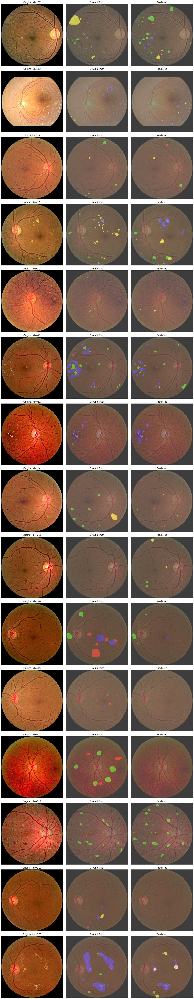

In [27]:
indices = random.sample(range(len(ds_val)), 15)
visualize_predictions(model, ds_val, indices=indices, device=device)